In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')


# set output directory
fig_dir = "/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/Nurr2c_vs_GFP/figures/"
data_dir = "/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/Nurr2c_vs_GFP/data/"

sc.settings.figdir = fig_dir

In [3]:
# load samples from cocaine mouse data:
cellranger_dir = '/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/data/cellranger/'

samples = ['Wood_Lab_{}'.format(x) for x in [1,2,3,4,5,6,7,8,9,10,11,13,14,15,16]]


In [4]:
adata_list = []
for sample in samples:
    print(sample)
    adata = sc.read_h5ad('{}{}/outs/scanpy_preprocessing_cellbender/data/adata_unfiltered.h5ad'.format(cellranger_dir, sample))
    adata.obs['Sample'] = 'Sample-{}'.format(sample.split('_')[2])
    adata.obs['orig_barcode'] = adata.obs.index
    adata_list.append(adata)

Wood_Lab_1
Wood_Lab_2
Wood_Lab_3
Wood_Lab_4
Wood_Lab_5
Wood_Lab_6
Wood_Lab_7
Wood_Lab_8
Wood_Lab_9
Wood_Lab_10
Wood_Lab_11
Wood_Lab_13
Wood_Lab_14
Wood_Lab_15
Wood_Lab_16


In [5]:
# combine all adata objects
adata = adata_list[0].concatenate(adata_list[1:])
adata.obs['barcode'] = adata.obs.index
adata.shape

# preserve counts
adata.layers["counts"] = adata.X.copy()

In [6]:
# load sample metadata:
sample_meta = pd.read_csv('/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/preliminary_analysis/data/targets_snRNAseq.csv')
sample_meta = sample_meta.rename({'Sample ID': 'Sample'}, axis=1)
sample_meta.Sample = ['Sample-{}'.format(s) for s in sample_meta.Sample]

# merge with anndata obs
temp = adata.obs.merge(sample_meta, how='left', on='Sample')
temp.index = temp.barcode
adata.obs = temp

In [7]:
# only keep cells from Nurr2c & GFP conditions
adata = adata[adata.obs.Group.isin(['Nurr2c', 'GFP'])]
adata.obs.head()

,doublet_scores,doublets,Sample,orig_barcode,batch,barcode,Assignment,Sample.No.,Name..Wood.lab.marking.,Group,Index
barcode,,,,,,,,,,,
AGGGCTCTCACCTGTC-1-0,0.203540,Singlet,Sample-1,AGGGCTCTCACCTGTC-1,0,AGGGCTCTCACCTGTC-1-0,Group1,10,Sample1353,Nurr2c,A1
TGTCCACGTCACGTGC-1-0,0.286713,Doublet,Sample-1,TGTCCACGTCACGTGC-1,0,TGTCCACGTCACGTGC-1-0,Group1,10,Sample1353,Nurr2c,A1
CCGATGGAGGTCATCT-1-0,0.111366,Singlet,Sample-1,CCGATGGAGGTCATCT-1,0,CCGATGGAGGTCATCT-1-0,Group1,10,Sample1353,Nurr2c,A1
ATTCACTGTCCATCTC-1-0,0.076923,Singlet,Sample-1,ATTCACTGTCCATCTC-1,0,ATTCACTGTCCATCTC-1-0,Group1,10,Sample1353,Nurr2c,A1
TAGATCGTCTCATAGG-1-0,0.273543,Doublet,Sample-1,TAGATCGTCTCATAGG-1,0,TAGATCGTCTCATAGG-1-0,Group1,10,Sample1353,Nurr2c,A1


## Quality control

In [8]:
# compute QC metrics
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

Trying to set attribute `.var` of view, copying.


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Sample' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'orig_barcode' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `i

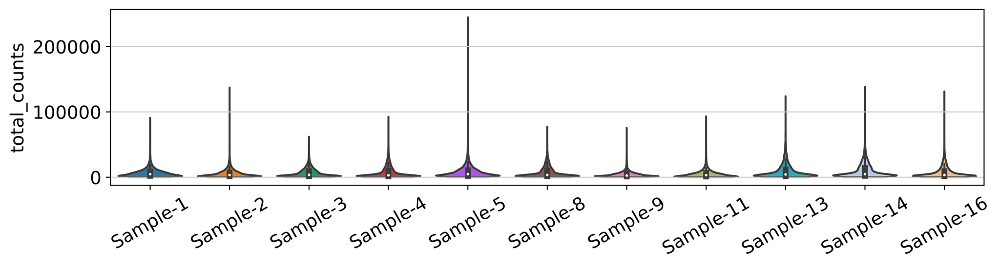

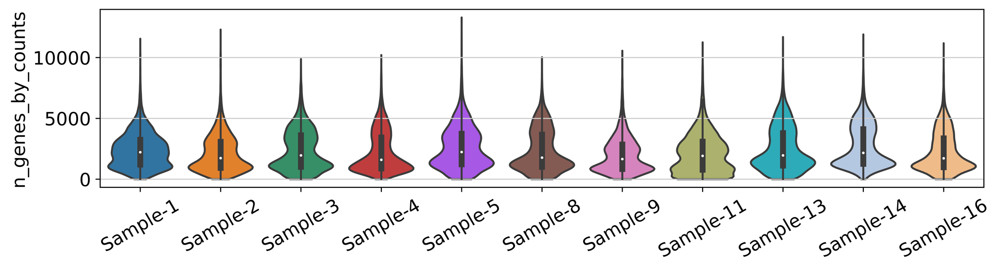

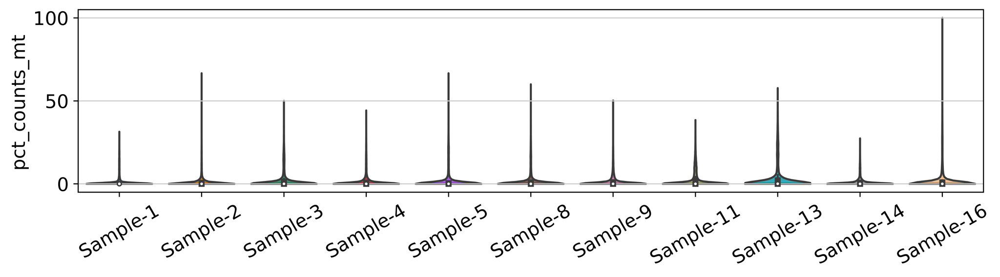

In [9]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)

In [10]:

mt_quantile = 0.975 
umi_quantile = 0.975
doublet_quantile = 0.975

samples = adata.obs.Sample.value_counts().index.to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.Sample == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_scores.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_scores < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.barcode.to_list() 
    good_barcodes = good_barcodes + keep_cells
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells)

    

Sample-11 removed  1056 , kept  12151
Sample-3 removed  832 , kept  9679
Sample-8 removed  781 , kept  8619
Sample-9 removed  724 , kept  8041
Sample-2 removed  650 , kept  7854
Sample-16 removed  651 , kept  7810
Sample-5 removed  637 , kept  7687
Sample-1 removed  633 , kept  7672
Sample-4 removed  645 , kept  7382
Sample-14 removed  487 , kept  5875
Sample-13 removed  526 , kept  5749


In [11]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)]
adata.shape

(88519, 32285)

In [12]:
# get rid of more outliers:
adata = adata[adata.obs.n_genes_by_counts >= 250]
adata = adata[adata.obs.pct_counts_mt <= 5]
adata = adata[adata.obs.total_counts <= 25000]
adata.shape


(79793, 32285)

In [13]:
# remove predicted doublets
adata = adata[adata.obs.doublets == 'Singlet']
adata.shape


(73960, 32285)

In [142]:
# add info from the old processed data:
adata_old = sc.read_h5ad("/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/analysis/test_harmony/data/harmony_processed_with_counts.h5ad")
adata_old.obs.Group.isin(['Nurr2c', 'GFP']).value_counts()

True     60252
False    34348
Name: Group, dtype: int64

In [143]:
adata_old = adata_old[adata_old.obs.barcode.isin(adata.obs.barcode)]
adata_old.shape

(55090, 32285)

In [144]:
old_meta = adata_old.obs[['barcode', 'leiden', 'clusternum_anno', 'celltype']]
old_meta.columns = ['barcode'] + [i + "_old" for i in old_meta.columns[1:]]

In [145]:
temp = adata.obs.merge(
    old_meta, how='left',
    on = 'barcode'
)


temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None



In [146]:
adata.obs.head()

,doublet_scores,doublets,Sample,orig_barcode,batch,barcode,Assignment,Sample.No.,Name..Wood.lab.marking.,Group,Index,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden_old,clusternum_anno_old,celltype_old
ATAGAGATCCGCACTT-1-0,0.133940,Singlet,Sample-1,ATAGAGATCCGCACTT-1,0,ATAGAGATCCGCACTT-1-0,Group1,10,Sample1353,Nurr2c,A1,5863,22094.0,0.0,0.000000,9,LHb Neuron-9,LHb Neuron
AGAGCAGCAGACGGAT-1-0,0.108108,Singlet,Sample-1,AGAGCAGCAGACGGAT-1,0,AGAGCAGCAGACGGAT-1-0,Group1,10,Sample1353,Nurr2c,A1,6068,22372.0,0.0,0.000000,4,PHb Neuron-4,PHb Neuron
ACCTACCAGTCTGTAC-1-0,0.108108,Singlet,Sample-1,ACCTACCAGTCTGTAC-1,0,ACCTACCAGTCTGTAC-1-0,Group1,10,Sample1353,Nurr2c,A1,5411,22398.0,0.0,0.000000,9,LHb Neuron-9,LHb Neuron
GTGAGCCGTATTTCCT-1-0,0.076923,Singlet,Sample-1,GTGAGCCGTATTTCCT-1,0,GTGAGCCGTATTTCCT-1-0,Group1,10,Sample1353,Nurr2c,A1,5176,22163.0,1.0,0.004512,4,PHb Neuron-4,PHb Neuron
CCCATTGCATCATCTT-1-0,0.055556,Singlet,Sample-1,CCCATTGCATCATCTT-1,0,CCCATTGCATCATCTT-1-0,Group1,10,Sample1353,Nurr2c,A1,4891,22197.0,9.0,0.040546,NaN,NaN,NaN


In [147]:
# save unprocessed data:

adata.obs.index.name = None
adata.write('{}initial_unprocessed.h5ad'.format(data_dir))

In [302]:
# remove most of the obs columns because it really doesn't like NaNs
adata.obs = adata.obs[['Sample', 'barcode', 'Assignment', 'Group']]

adata.write('{}initial_unprocessed_for_seurat.h5ad'.format(data_dir))

## Data normalization, clustering, dimensionality reduction

In [301]:
adata = sc.read_h5ad('{}initial_unprocessed.h5ad'.format(data_dir))

In [149]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [150]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=16)
sc.pp.scale(adata, max_value=10)

In [151]:
sc.tl.pca(adata, svd_solver='arpack')

In [152]:
sc.external.pp.harmony_integrate(adata, key = 'Assignment')

2021-12-17 15:17:20,707 - harmonypy - INFO - Iteration 1 of 10
2021-12-17 15:17:56,413 - harmonypy - INFO - Iteration 2 of 10
2021-12-17 15:18:27,236 - harmonypy - INFO - Iteration 3 of 10
2021-12-17 15:19:03,161 - harmonypy - INFO - Iteration 4 of 10
2021-12-17 15:19:38,936 - harmonypy - INFO - Iteration 5 of 10
2021-12-17 15:20:14,798 - harmonypy - INFO - Iteration 6 of 10
2021-12-17 15:20:50,366 - harmonypy - INFO - Iteration 7 of 10
2021-12-17 15:21:24,037 - harmonypy - INFO - Iteration 8 of 10
2021-12-17 15:21:54,438 - harmonypy - INFO - Iteration 9 of 10
2021-12-17 15:22:24,326 - harmonypy - INFO - Iteration 10 of 10
2021-12-17 15:22:54,337 - harmonypy - INFO - Stopped before convergence


In [153]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=15, n_pcs=30, metric='cosine')

In [154]:
sc.tl.umap(adata, min_dist=0.2, method='umap')

In [155]:
sc.tl.leiden(adata, resolution=1.5)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

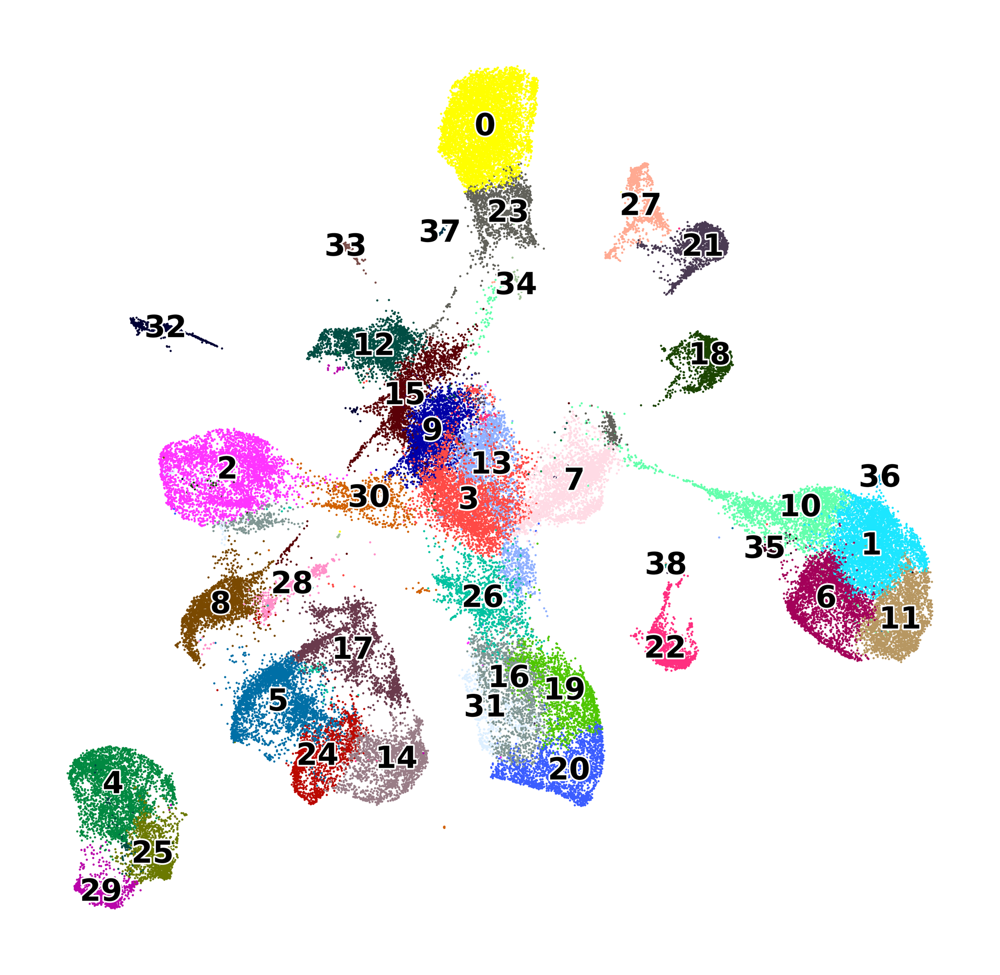

In [156]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title='', 
    save='_leiden.pdf'
)


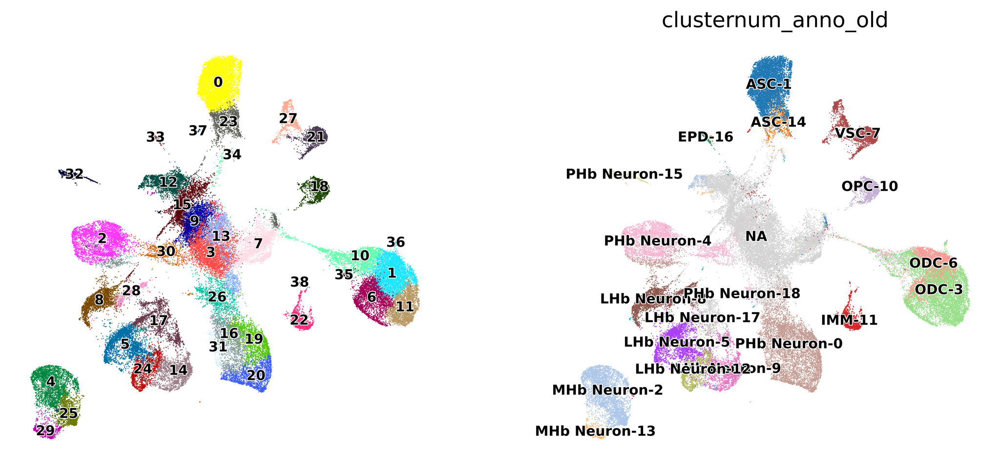

In [157]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden',  'clusternum_anno_old'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title='', 
    save='_leiden_compare.pdf'
)


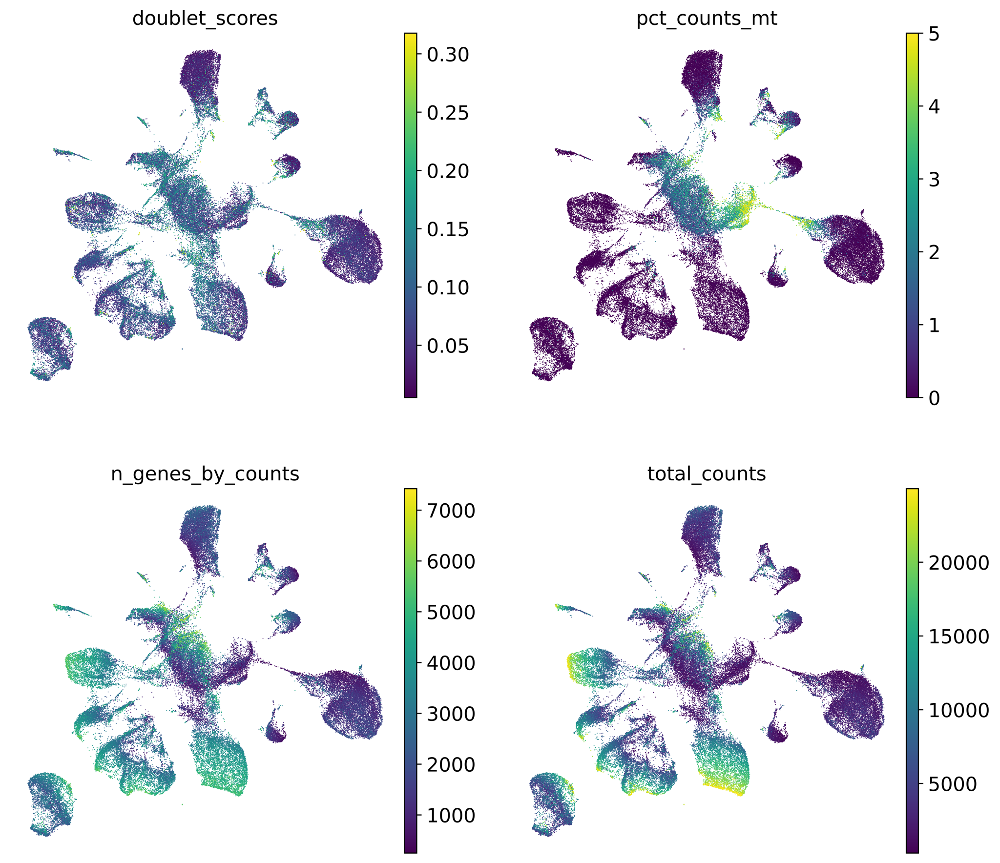

In [158]:
sc.pl.umap(adata, color=['doublet_scores', 'pct_counts_mt', 'n_genes_by_counts', 'total_counts'],frameon=False, ncols=2, save='_qc.pdf')

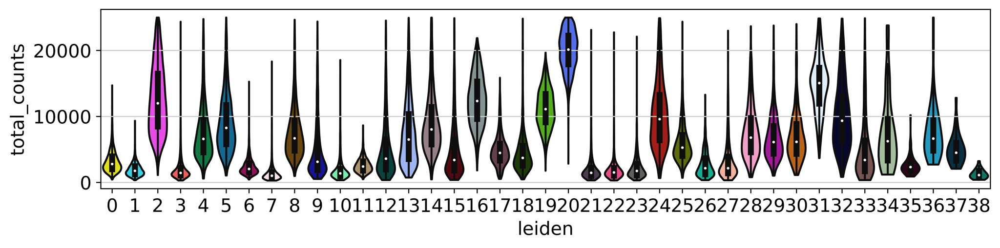

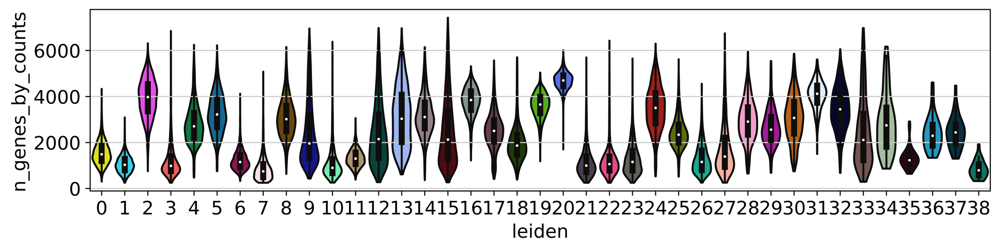

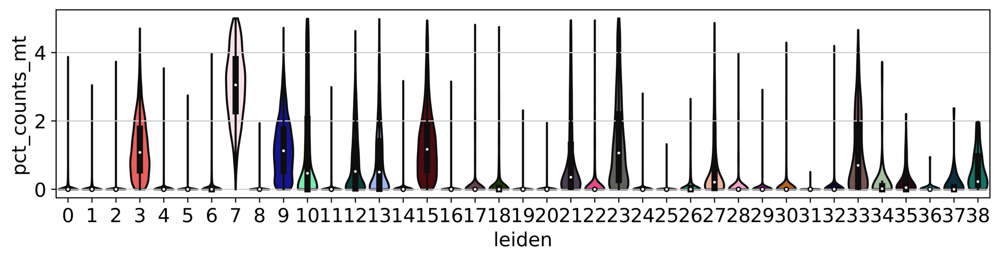

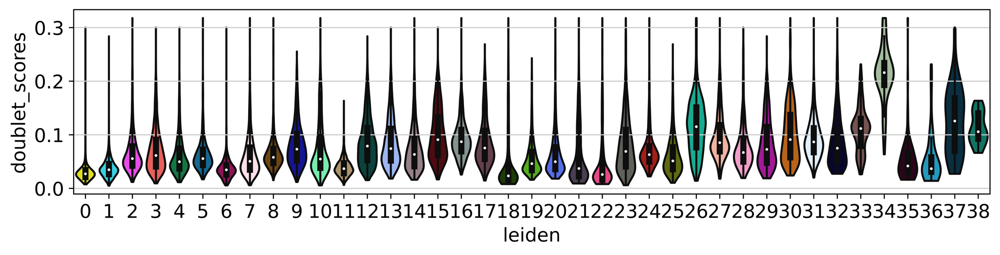

In [159]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False)
sc.pl.violin(adata,[ 'doublet_scores'], inner='box', size=0,  groupby='leiden', multi_panel=False)

categories: 0, 1, 2, etc.
var_group_labels: MF-ODC, Mature ODC, Neuron, etc.


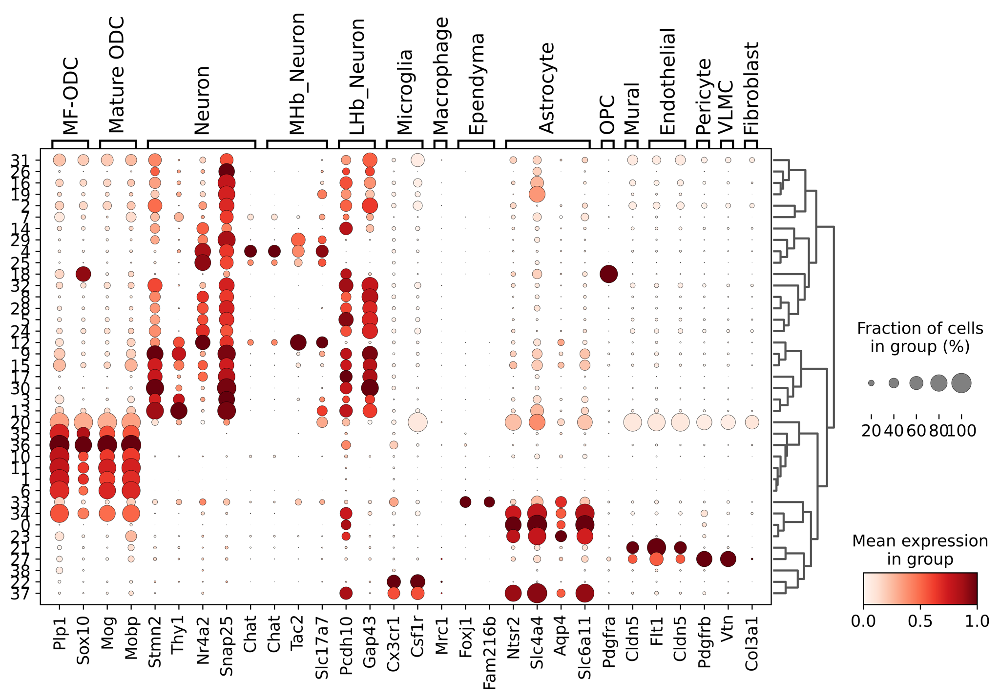

In [160]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(15,5), facecolor='white')

# marker genes from dotplot:
marker_dict = {
    'MF-ODC' : ['Plp1', 'Sox10'],
    'Mature ODC' : ['Mog', 'Mobp'],
    'Neuron' : ['Stmn2', 'Thy1', 'Nr4a2', 'Snap25', 'Chat'],
    'MHb_Neuron': ['Chat', 'Tac2', 'Slc17a7'],
    'LHb_Neuron': ['Pcdh10', 'Gap43'],
    'Microglia': ['Cx3cr1', 'Csf1r'],
    'Macrophage': ['Mrc1'],
    'Ependyma':['Foxj1', 'Fam216b'],
    'Astrocyte' : ['Ntsr2', 'Slc4a4', 'Aqp4', 'Slc6a11'],
    'OPC' : ['Pdgfra'],
    'Mural' : ['Cldn5'],
    'Endothelial': ['Flt1', 'Cldn5'],
    'Pericyte': ['Pdgfrb'],
    'VLMC': ['Vtn'],
    'Fibroblast': ['Col3a1']
}

sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers.pdf')

In [165]:
clusters_to_remove = [
    '7', # high MT
    '15',
    '9',
    '3',
    '13',
    '20', # low exp of many celltype markers
    '31', # ODC genes in neuron cluster
    '34',  # ODC ASC doublet 
    '37', # MG, Neuron, and ASC genes doublet  
]

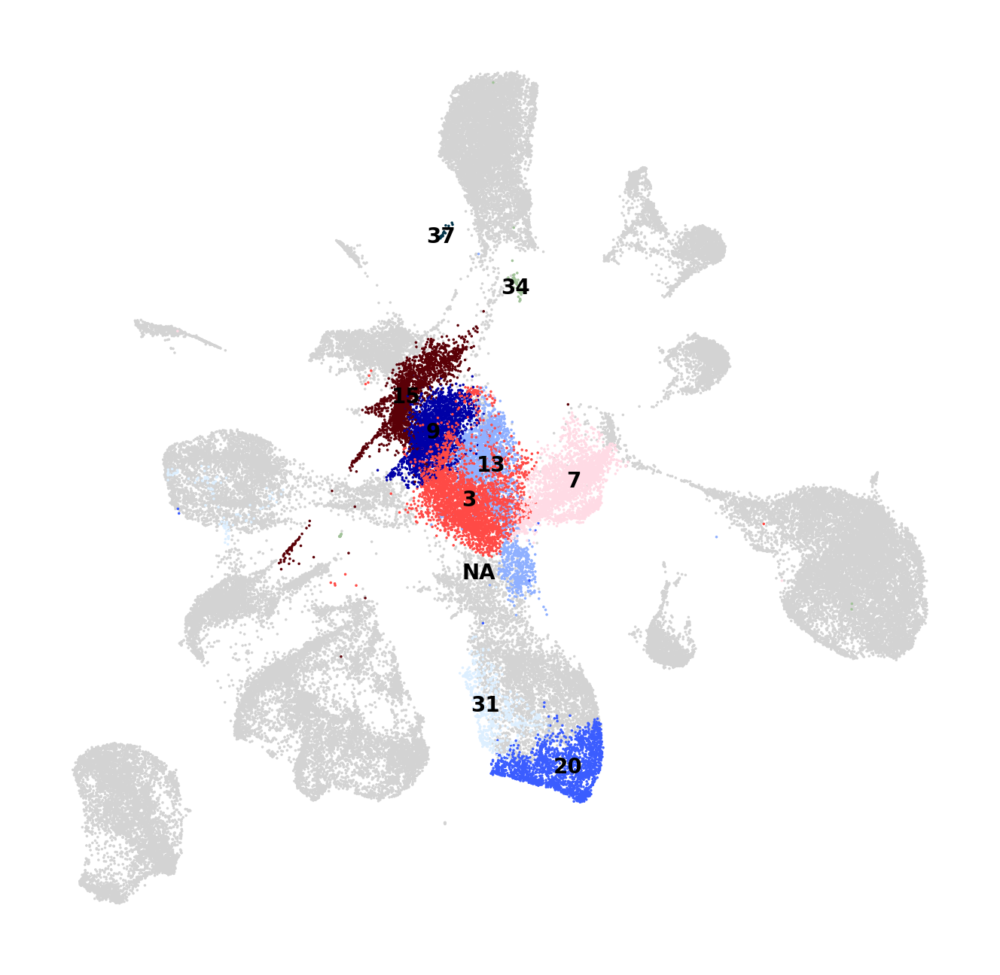

In [166]:
# clusters to remove based on low qc / conflicting markers
sc.settings.set_figure_params(dpi=200, figsize=(4,4), facecolor='white')
sc.pl.umap( 
    adata,
    color=["leiden"], 
    groups=clusters_to_remove,
    frameon=False, 
    legend_fontsize=5, 
    legend_loc='on data', 
    title=''
)


In [167]:
# save data
adata.obs.index.name = None
adata.write('{}initial_harmony.h5ad'.format(data_dir))

## Analyze with more filtering

In [168]:
adata.obs.leiden.isin(clusters_to_remove).value_counts()

False    58194
True     15766
Name: leiden, dtype: int64

In [169]:
# re-load first round harmony data and unprocessed data:

adata_unprocessed = sc.read_h5ad('{}initial_unprocessed.h5ad'.format(data_dir))
adata = sc.read_h5ad('{}initial_harmony.h5ad'.format(data_dir))


In [170]:
adata = adata[~adata.obs.leiden.isin(clusters_to_remove)]
adata_unprocessed = adata_unprocessed[adata_unprocessed.obs.barcode.isin(adata.obs.barcode)]
adata_unprocessed.obs = adata.obs

In [171]:
adata = adata_unprocessed

In [172]:
### Run processing again
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [173]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=16)
sc.pp.scale(adata, max_value=10)

In [174]:
sc.tl.pca(adata, svd_solver='arpack')

In [175]:
sc.external.pp.harmony_integrate(adata, key = 'Assignment')

2021-12-17 15:49:34,094 - harmonypy - INFO - Iteration 1 of 10
2021-12-17 15:49:58,298 - harmonypy - INFO - Iteration 2 of 10
2021-12-17 15:50:22,712 - harmonypy - INFO - Iteration 3 of 10
2021-12-17 15:50:45,673 - harmonypy - INFO - Iteration 4 of 10
2021-12-17 15:51:06,568 - harmonypy - INFO - Iteration 5 of 10
2021-12-17 15:51:16,750 - harmonypy - INFO - Iteration 6 of 10
2021-12-17 15:51:24,850 - harmonypy - INFO - Iteration 7 of 10
2021-12-17 15:51:32,947 - harmonypy - INFO - Iteration 8 of 10
2021-12-17 15:51:41,084 - harmonypy - INFO - Iteration 9 of 10
2021-12-17 15:51:49,254 - harmonypy - INFO - Iteration 10 of 10
2021-12-17 15:51:57,284 - harmonypy - INFO - Stopped before convergence


In [176]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=15, n_pcs=30, metric='cosine')

In [177]:
sc.tl.umap(adata, min_dist=0.25, method='umap')

In [181]:
adata.obs = adata.obs.drop('leiden', axis=1)

In [182]:
sc.tl.leiden(adata, resolution=0.7)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

In [183]:
adata.obs.leiden.value_counts()

0     7491
1     6754
2     4778
3     4765
4     3879
5     3374
6     3356
7     2779
8     2663
9     2071
10    1862
11    1831
12    1668
13    1643
14    1563
15    1451
16    1230
17    1213
18     800
19     780
20     776
21     611
22     410
23     316
24      81
25      26
26      23
Name: leiden, dtype: int64

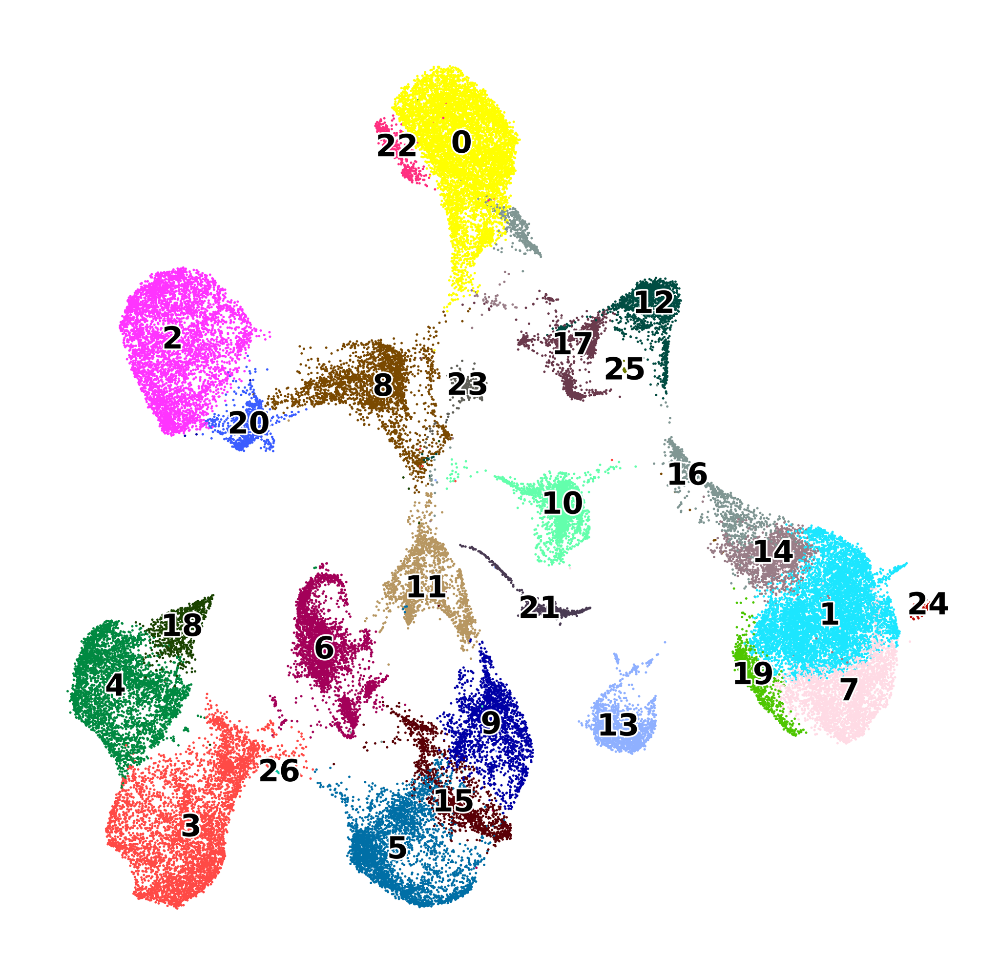

In [184]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden_filtered.pdf'
)


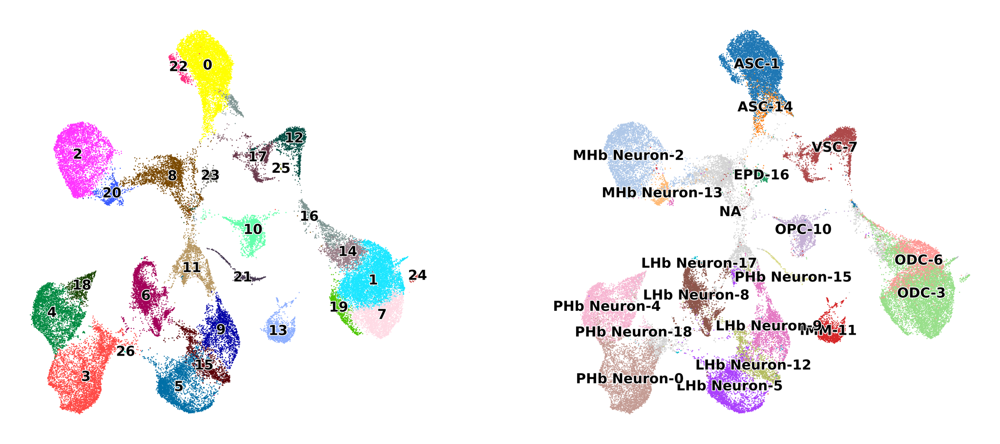

In [187]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden', 'clusternum_anno_old'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title=['', ''],
    save='_leiden_filtered_compare.pdf'
)


categories: 0, 1, 2, etc.
var_group_labels: MF-ODC, Mature ODC, Neuron, etc.


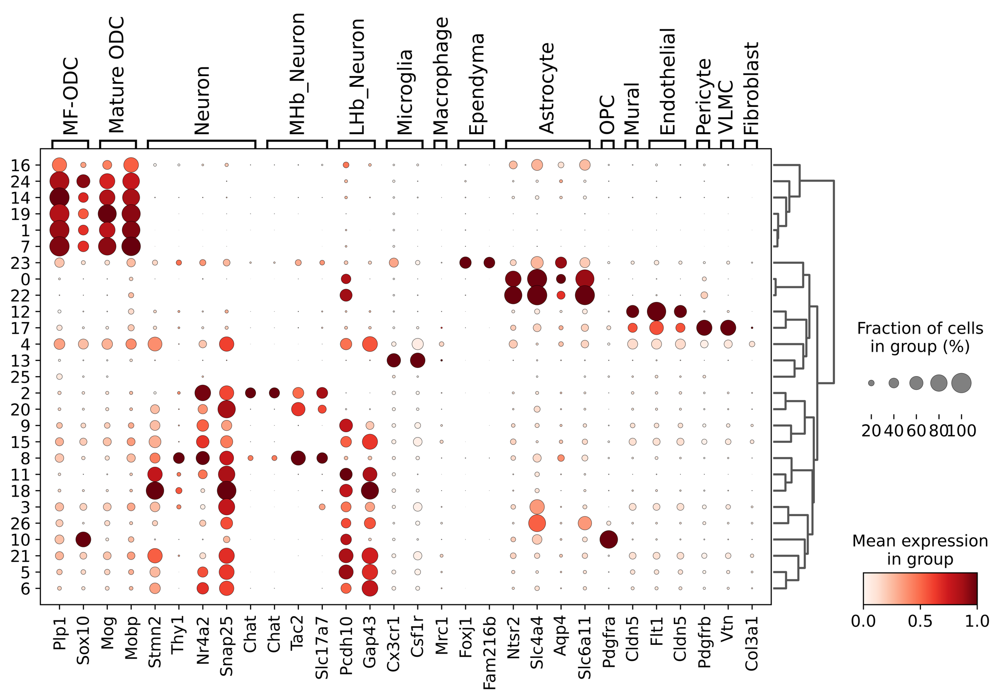

In [185]:
sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers_filtered.pdf')

In [188]:
# remove bad clusters
clusters_to_remove = [
    '16',
    '26',
    '22',
    '25'
]
adata = adata[~adata.obs.leiden.isin(clusters_to_remove)]

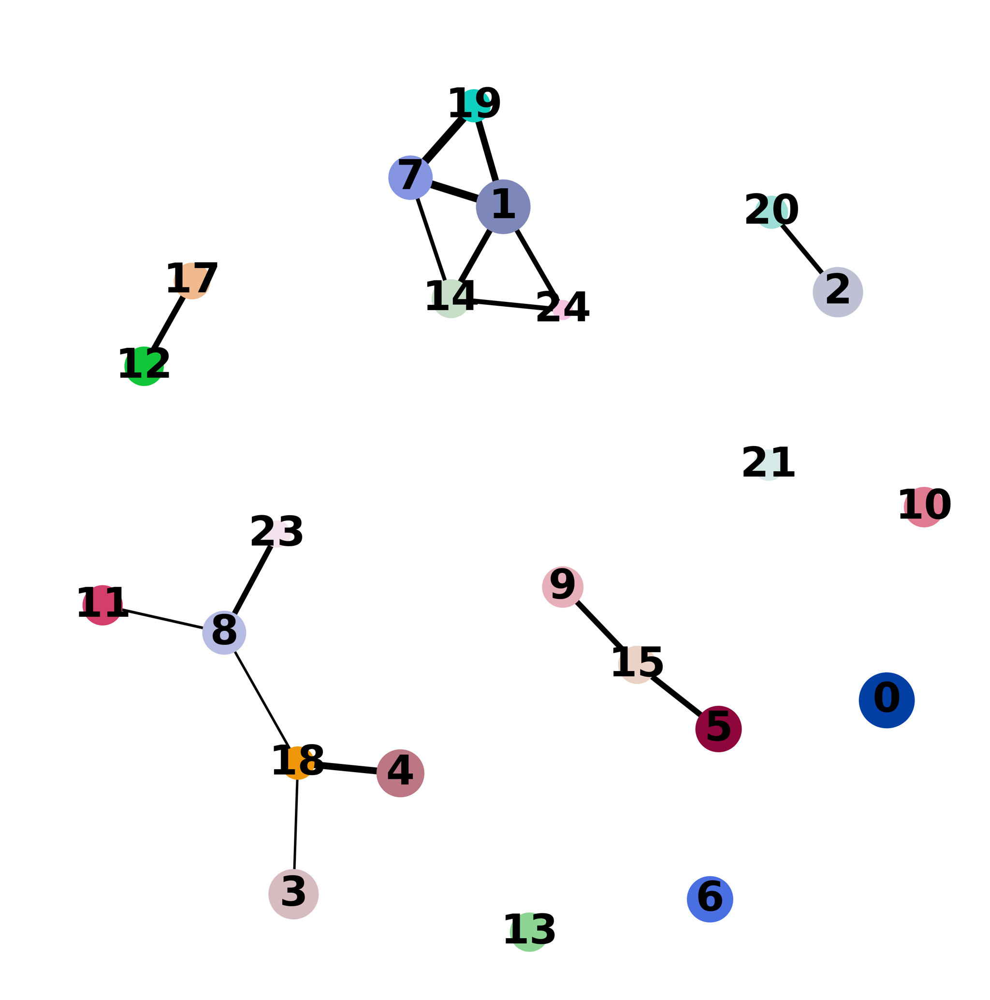

In [191]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.2, title='', edge_width_scale=0.5,
    frameon=False, save=True
)

In [192]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.25, init_pos='paga')

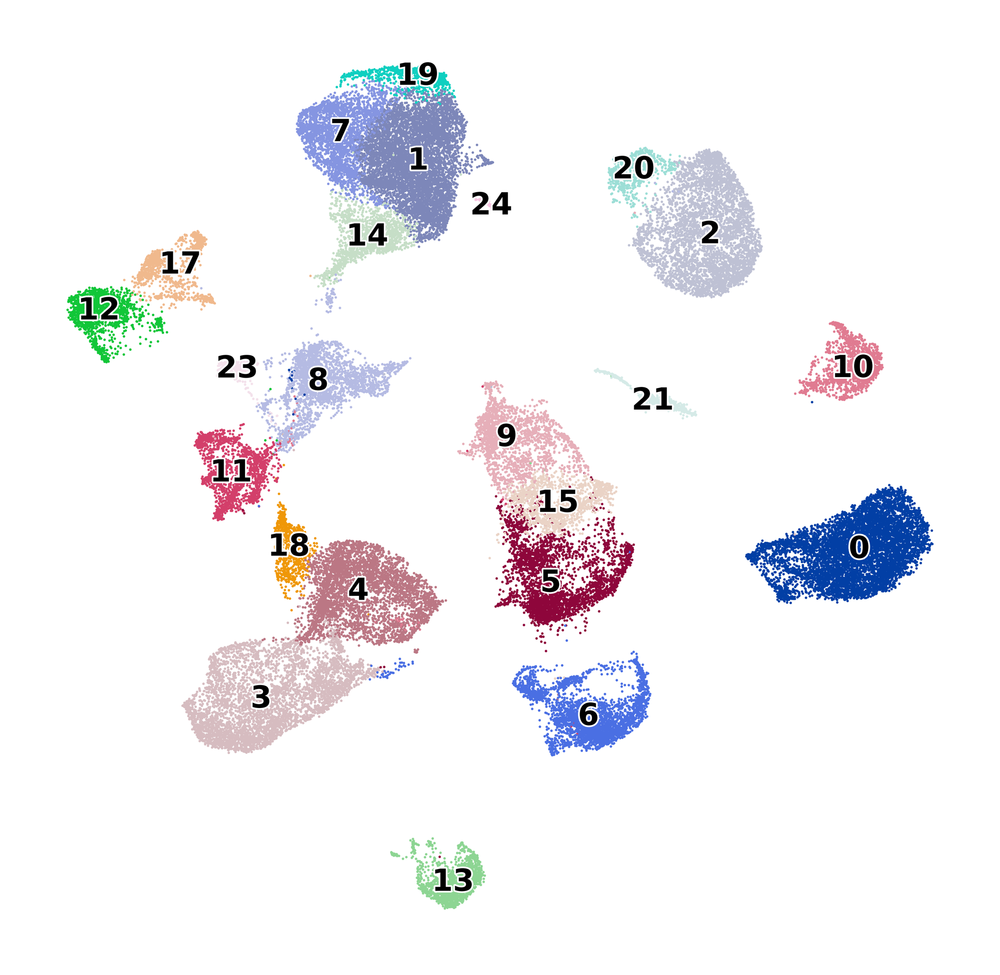

In [193]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title='', 
    save='_leiden_filtered_paga.pdf'
)


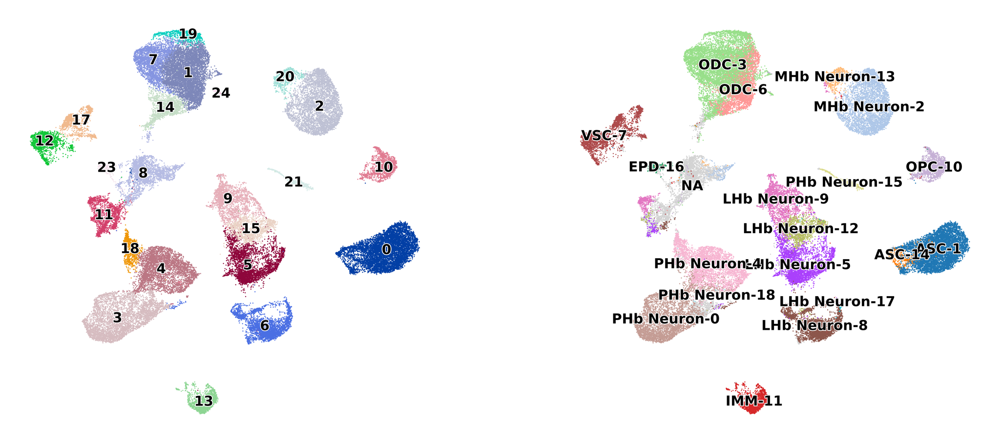

In [194]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden', 'clusternum_anno_old'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title=['', ''], 
    save='_leiden_filtered_paga_compare.pdf'
)


In [233]:
# add the UMAP to the obs table:
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]



In [197]:
adata.write('{}harmony_processed.h5ad'.format(data_dir))

## Broad cell-type annotations

In [202]:
# load cluster anno df 
anno_df = pd.read_csv(
    '/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/Nurr2c_vs_GFP/data/habenula_leiden_annotations.csv'
)

anno_df.leiden = anno_df.leiden.astype(str)
temp = adata.obs.merge(
    anno_df, how='left',
    on = 'leiden')
adata.obs['cell_type'] = temp['cell_type'].astype(str).to_list()



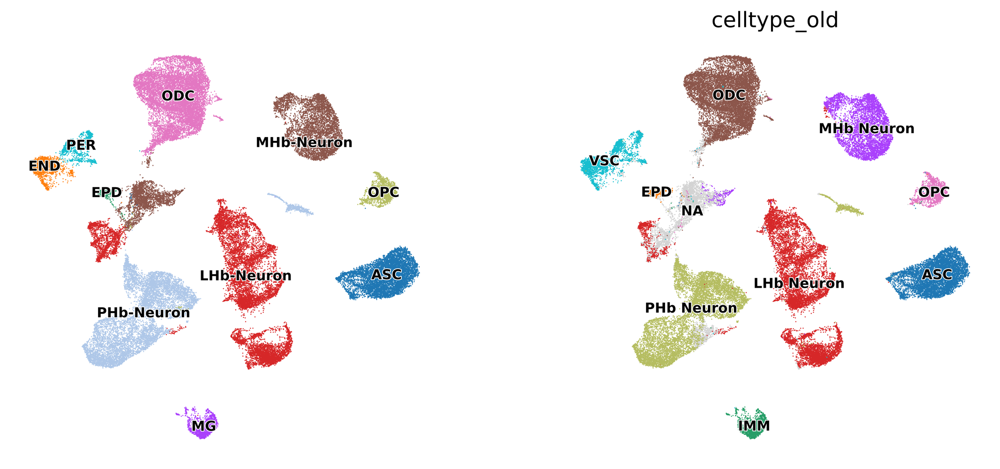

In [204]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['cell_type', 'celltype_old'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title='', 
    save='_celltype_compare.pdf'
)


In [205]:
adata.write('{}harmony_processed.h5ad'.format(data_dir))

## Subcluster Neurons

In [ ]:
# re-load dataset
adata = sc.read_h5ad('{}harmony_processed.h5ad'.format(data_dir))

In [207]:
# subset neuronal cells:
adata_neuron = adata[adata.obs.cell_type.isin(['PHb-Neuron', 'LHb-Neuron', 'MHb-Neuron'])]

In [208]:
sc.pp.neighbors(adata_neuron, use_rep = 'X_pca_harmony', n_neighbors=15, n_pcs=30, metric='cosine')
sc.tl.umap(adata_neuron, min_dist=0.25, method='umap')

In [212]:
sc.tl.leiden(adata_neuron, resolution=0.75)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata_neuron, 'leiden')

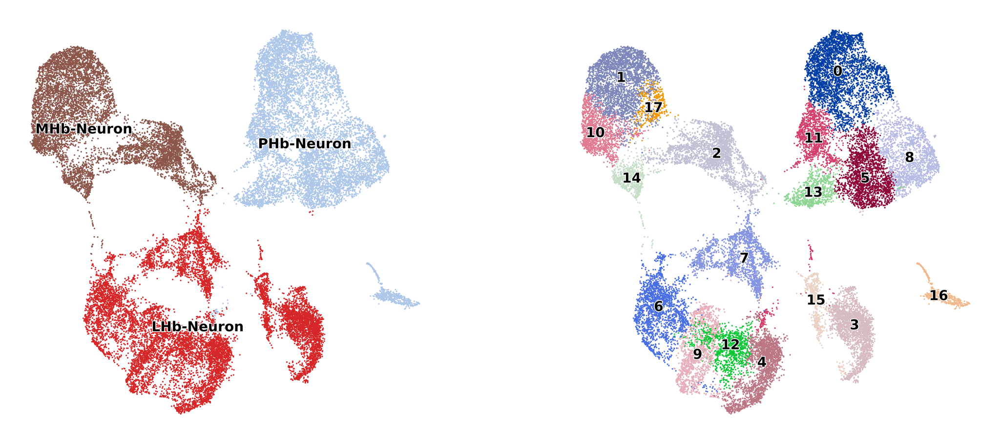

In [213]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_neuron, 
    color=['cell_type', 'leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title=['', ''], 
    save='_neuronal_leiden.pdf'
)


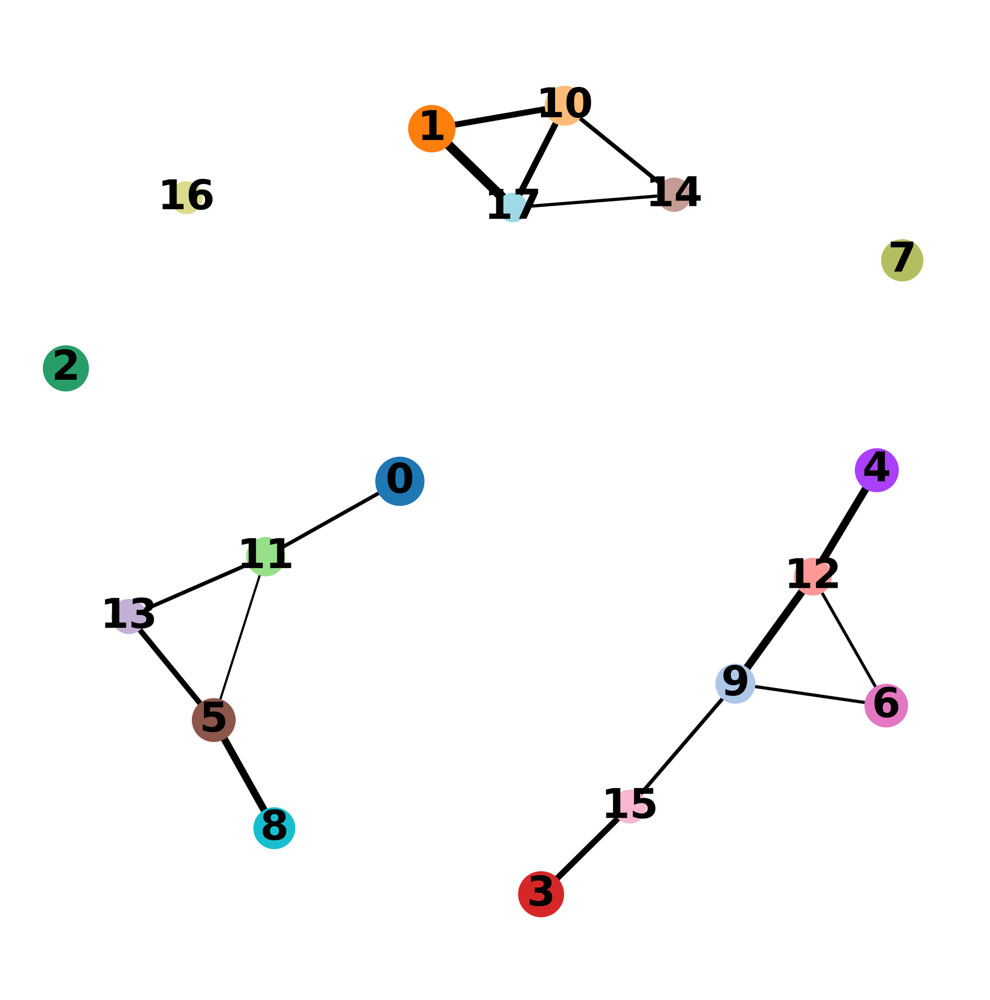

In [218]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata_neuron)
sc.pl.paga(
    adata_neuron, threshold=0.15, title='', edge_width_scale=0.5,
    frameon=False, save='_neuronal_paga.pdf'
)


In [219]:
sc.tl.umap(adata_neuron, min_dist=0.25, init_pos='paga')

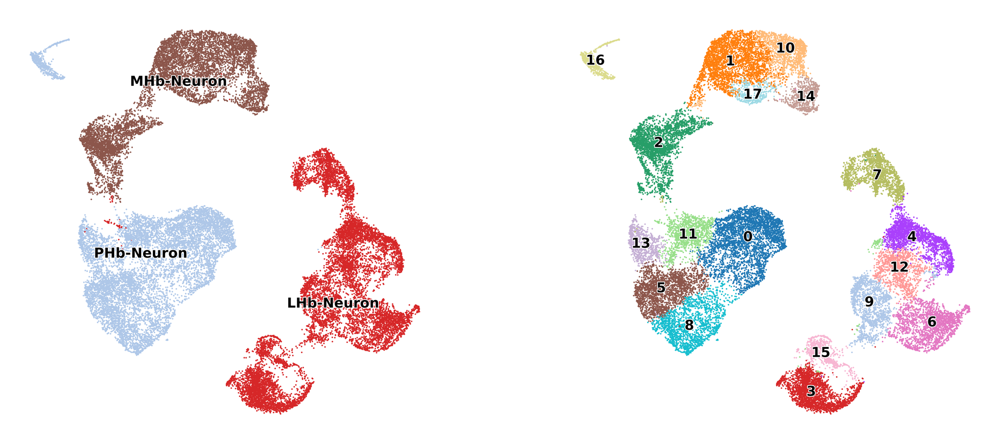

In [220]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_neuron, 
    color=['cell_type', 'leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title=['', ''], 
    save='_neuronal_leiden_paga.pdf'
)


In [223]:
# load cluster anno df 
anno_df = pd.read_csv(
    '/dfs7/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/Nurr2c_vs_GFP/data/habenula_neuronal_leiden_annotations.csv'
)

anno_df.leiden = anno_df.leiden.astype(str)
anno_df.head()

,leiden,cell_type,annotation
0,0,PHb-Neuron,PHb-1
1,1,MHb-Neuron,MHb-1
2,2,MHb-Neuron,MHb-2
3,3,LHb-Neuron,LHb-1
4,4,LHb-Neuron,LHb-2


In [224]:
adata_neuron.obs = adata_neuron.obs.drop('cell_type',axis=1)

temp = adata_neuron.obs.merge(
    anno_df, how='left',
    on = 'leiden')
adata_neuron.obs['cell_type'] = temp['cell_type'].astype(str).to_list()
adata_neuron.obs['annotation'] = temp['annotation'].astype(str).to_list()



/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'annotation' as categorical


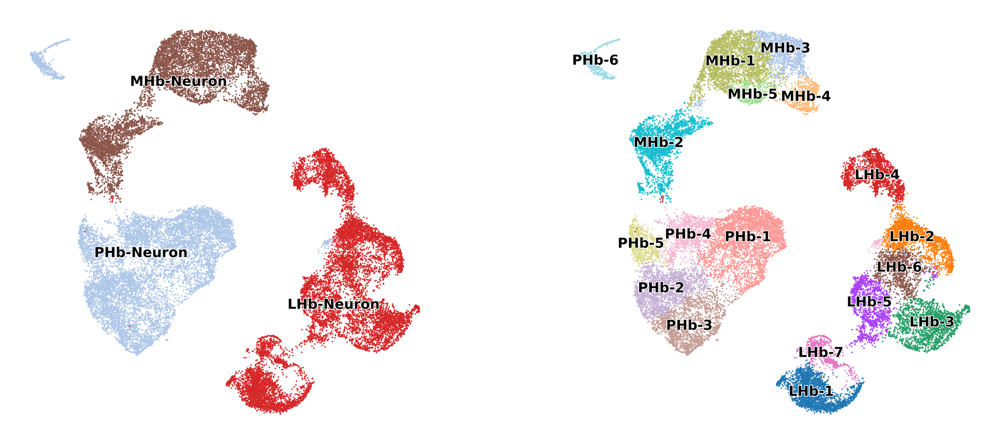

In [225]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata_neuron, 
    color=['cell_type', 'annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title=['', ''], 
    save='_neuronal_leiden_annotation.pdf'
)


In [234]:
adata_neuron.obs['neuron_UMAP_1'] = adata_neuron.obsm['X_umap'][:,0]
adata_neuron.obs['neuron_UMAP_2'] = adata_neuron.obsm['X_umap'][:,1]


In [235]:
# save data with the cluster labels:
adata_neuron.write('{}neuronal_processed.h5ad'.format(data_dir))
adata_neuron.obs.to_csv('{}neuronal_processed_cell_meta.csv'.format(data_dir))

## add neuronal subclusters to the full data object

In [238]:
# load data 
adata_neuron = sc.read('{}neuronal_processed.h5ad'.format(data_dir))
neuron_meta = adata_neuron.obs[['barcode', 'leiden', 'cell_type', 'annotation', 'neuron_UMAP_1', 'neuron_UMAP_2']]
neuron_meta = neuron_meta.rename({
    'leiden':'neuron_leiden',
    'cell_type':'neuron_type'
}, axis=1)
neuron_meta.head()

,barcode,neuron_leiden,neuron_type,annotation,neuron_UMAP_1,neuron_UMAP_2
ATAGAGATCCGCACTT-1-0,ATAGAGATCCGCACTT-1-0,6,LHb-Neuron,LHb-3,11.854525,-2.002780
AGAGCAGCAGACGGAT-1-0,AGAGCAGCAGACGGAT-1-0,8,PHb-Neuron,PHb-3,-0.827034,-2.214332
ACCTACCAGTCTGTAC-1-0,ACCTACCAGTCTGTAC-1-0,6,LHb-Neuron,LHb-3,11.558245,-1.808692
GTGAGCCGTATTTCCT-1-0,GTGAGCCGTATTTCCT-1-0,8,PHb-Neuron,PHb-3,0.780995,-1.185169
GCACGGTTCCTCACCA-1-0,GCACGGTTCCTCACCA-1-0,8,PHb-Neuron,PHb-3,-0.015879,-2.541773


In [240]:
# transfer metadata
temp = adata.obs.merge(
    neuron_meta, how='left',
    on = 'barcode'
)


temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None

# upadte cell type column
adata.obs['cell_type'] = np.where(
    adata.obs.cell_type.isin(['MHb-Neuron', 'LHb-Neuron', 'PHb-Neuron']),
    adata.obs.neuron_type,
    adata.obs.cell_type
)

# set annotation
adata.obs['annotation'] = np.where(
    adata.obs.cell_type.isin(['MHb-Neuron', 'LHb-Neuron', 'PHb-Neuron']),
    adata.obs.annotation,
    adata.obs.cell_type
)


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'annotation' as categorical


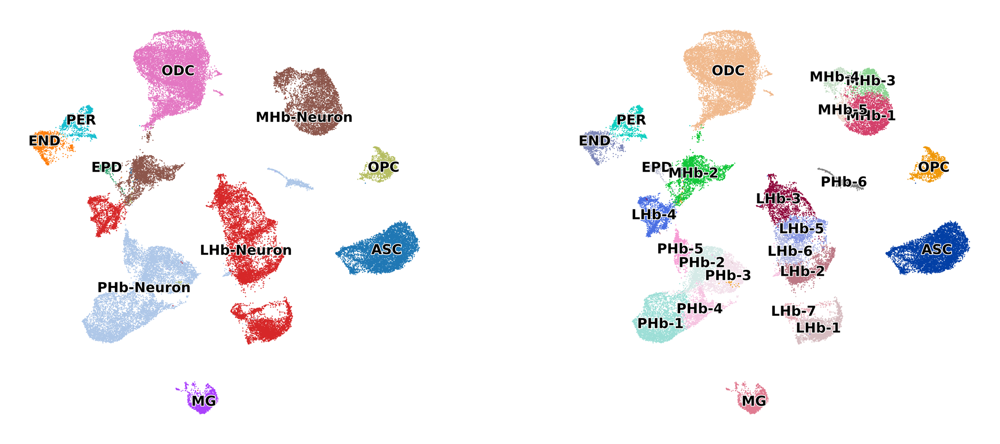

In [246]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['cell_type', 'annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    add_outline=False, 
    title=['', ''], 
    save='_full_neuronal_leiden_annotation.pdf'
)


In [252]:
# remove meta-data columns that we don't need:
adata.obs = adata.obs.drop(['doublets', 'Name..Wood.lab.marking.', 'Sample.No.', 'batch'], axis=1)

In [253]:
# save the annotated data object
adata.write('{}harmony_annotated.h5ad'.format(data_dir))


## Save the individual components so we can make a seurat obj from scratch 

* Counts matrix (genes x cells .mtx)
* Scaled data matrix  (genes x cells .mtx)
* PCA 
* Harmony 
* obs table 
* var table

In [295]:
adata = sc.read_h5ad('{}harmony_annotated.h5ad'.format(data_dir))

In [296]:
# write the obs and var tables:
adata.obs.to_csv('{}harmony_annotated_cell_meta.csv'.format(data_dir))
adata.var.to_csv('{}harmony_annotated_gene_meta.csv'.format(data_dir))


In [298]:
# remove most of the obs columns because it really doesn't like NaNs
adata.obs = adata.obs[['Sample', 'barcode', 'Assignment', 'Group']]

In [299]:
# re-name harmony
adata.obsm['X_harmony'] = adata.obsm['X_pca_harmony']
del adata.obsm['X_pca_harmony']

In [300]:
adata.write('{}harmony_annotated_for_seurat.h5ad'.format(data_dir))

